In [1]:
%reload_ext autoreload
%autoreload 2

import os
import acled_conflict_analysis as acled
from acled_conflict_analysis import visuals
from acled_conflict_analysis import processing
from acled_conflict_analysis import extraction


from bokeh.plotting import show, output_notebook
import bokeh
from bokeh.core.validation.warnings import EMPTY_LAYOUT, MISSING_RENDERERS
from bokeh.models import Panel, Tabs, TabPanel

from datetime import date
from datetime import datetime


In [2]:
countries_of_interest = ["Ethiopia"]
START_DATE = "2018-01-01"
END_DATE = "2024-05-10"

In [3]:
os.environ['ACLED_EMAIL'] = extraction.get_acled_credentials()[0]
os.environ['ACLED_KEY'] = extraction.get_acled_credentials()[1]

In [4]:
data = extraction.acled_api(
    email_address=os.environ.get("ACLED_EMAIL"),
    access_key=os.environ.get("ACLED_KEY"),
    countries=countries_of_interest,
    start_date=START_DATE,
    end_date=END_DATE
)


c:\WBG\Anaconda3\envs\acled\Lib\site-packages\urllib3\connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'api.acleddata.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


In [5]:
processing.data_type_conversion(data)

In [6]:
conflict_monthly = processing.get_acled_by_group(data, columns=['latitude', 'longitude', 'country'], freq='MS')
conflict_yearly = processing.get_acled_by_group(data, columns=['latitude', 'longitude', 'country'], freq='YS')
conflict_yearly_national = processing.get_acled_by_group(data, columns=['country'], freq='Y')
conflict_sub_event_type = processing.get_acled_by_group(data, columns = ['event_type', 'sub_event_type', 'country'], freq='MS')
conflict_event_type = processing.get_acled_by_group(data, columns = ['country','event_type'], freq='MS')

c:\WBG\Anaconda3\envs\acled\Lib\site-packages\acled_conflict_analysis\processing.py:193: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  conflict_grouped.groupby([pd.Grouper(key="event_date", freq=freq)]+columns)["fatalities"]


In [7]:
conflict_yearly = processing.convert_to_gdf(conflict_yearly)

<Axes: >

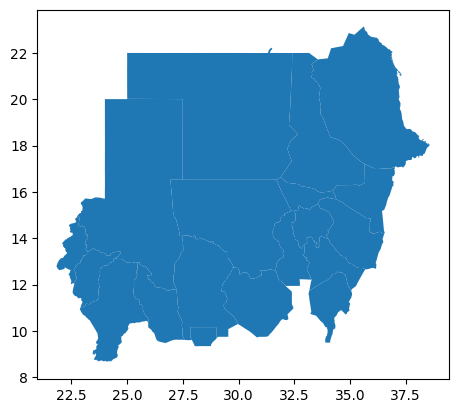

In [99]:
import geopandas as gpd
boundary_1 = gpd.read_file('../data/boundaries/sudan/State_Poly_Mar20.shp')
boundary_1.plot()

<Axes: >

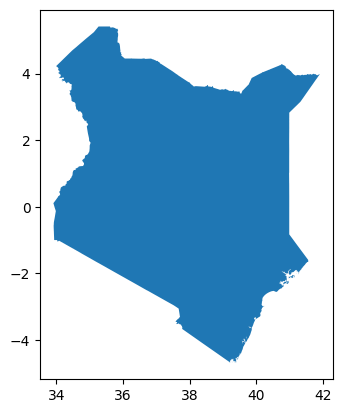

In [101]:
import geopandas as gpd
boundary_2 = gpd.read_file('../data/boundaries/kenya/ken_admbnda_adm0_iebc_20191031.shp')
boundary_2.plot()

In [104]:
# h3_boundary_1 = processing.convert_to_h3_grid(boundary_1, resolution=4)
# h3_boundary_2 = processing.convert_to_h3_grid(boundary_2, resolution=4)
import pandas as pd
h3_boundary = pd.concat([h3_boundary_1, h3_boundary_2], ignore_index=True)

In [115]:
conflict_yearly_h3 = processing.get_acled_by_admin(h3_boundary, data, columns=['h3_index', 'country'], freq='YS')

In [116]:
conflict_yearly_h3 = h3_boundary.merge(conflict_yearly_h3, on='h3_index', how='left')

In [120]:
boundary_gdf = {'Sudan': boundary_1, 'Kenya': boundary_2}

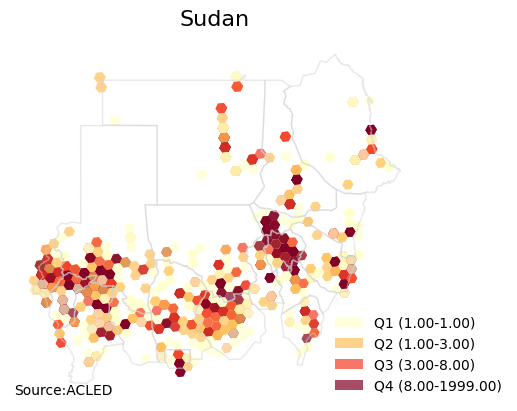

In [117]:
visuals.get_h3_maps(conflict_yearly_h3[conflict_yearly_h3['country']=='Sudan'], title='Sudan', 
                    boundary_gdf=boundary_1, cmap_name='YlOrRd',
                    figsize=(6,4),
                    subtitle='Source:ACLED');

(<Figure size 1600x600 with 2 Axes>,
 array([[<Axes: title={'center': 'Sudan'}>,
         <Axes: title={'center': 'Kenya'}>]], dtype=object))

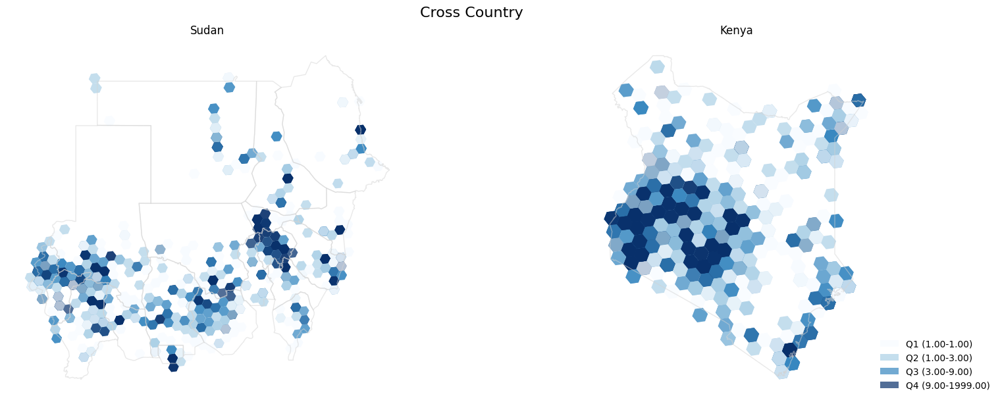

In [121]:
visuals.plot_h3_maps_by_column_value(
    conflict_yearly_h3,
    boundary_gdfs_map=boundary_gdf,
    column_name ='country',
    title='Cross Country',
    subtitle_prefix='',
)


In [131]:
?visuals.create_single_bivariate_conflict_map

Signature:
visuals.create_single_bivariate_conflict_map(
    conflict_data_gdf,
    measure1_col,
    measure2_col,
    title='Conflict Patterns: Events × Fatalities',
    figsize=(8, 6),
    subtitle=None,
    boundary_gdf=None,
    show_legend=True,
)
Docstring:
Plot a single H3 grid map with color representing the combination of two specified measures.

Parameters:
-----------
conflict_data_gdf : GeoDataFrame
    The data to plot.
measure1_col : str
    The name of the first measure column (e.g., 'nrEvents').
measure2_col : str
    The name of the second measure column (e.g., 'nrFatalities').
title : str
    The main title for the plot (displayed at the top).
figsize : tuple, optional
    The size of the figure (width, height) in inches. Defaults to (8, 6).
subtitle : str, optional
    An optional subtitle for the plot, displayed in the bottom-left corner. Defaults to None.
boundary_gdf : GeoDataFrame, optional
    Geographical boundaries to plot on the map.
show_legend : bool, opti

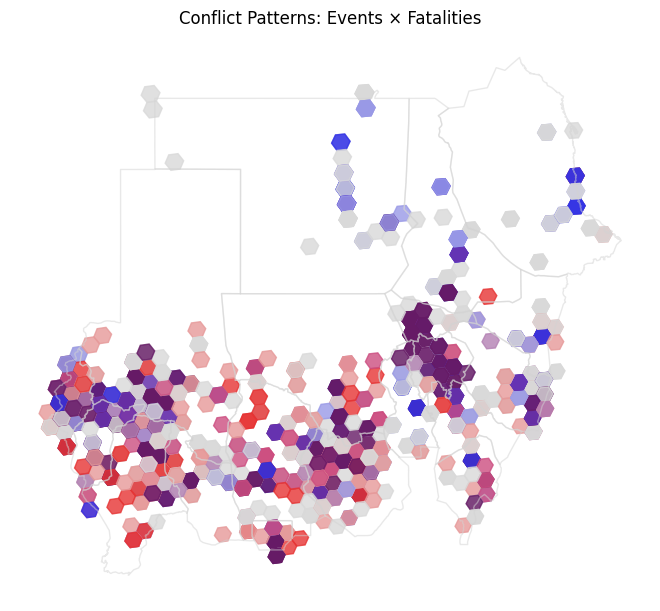

In [ ]:
visuals.create_single_bivariate_conflict_map(conflict_yearly_h3[conflict_yearly_h3['country']=='Sudan'],
                                             measure1_col='nrEvents',
                                             measure2_col='nrFatalities',
                                             boundary_gdf=boundary_1,
                                             show_legend=False);

(<Figure size 1600x600 with 3 Axes>,
 array([[<Axes: title={'center': 'Category: Sudan'}>,
         <Axes: title={'center': 'Category: Kenya'}>]], dtype=object))

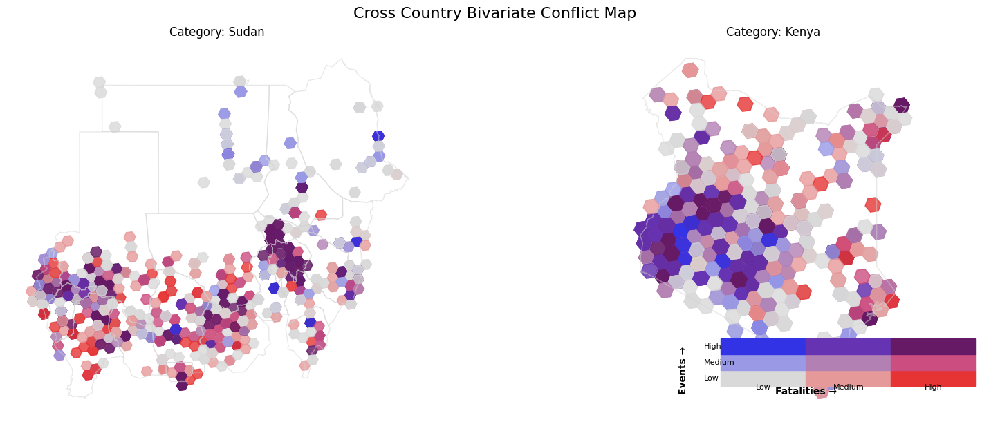

In [135]:
visuals.plot_bivariate_maps_by_column_value(
    conflict_yearly_h3,
    boundary_gdfs_map=boundary_gdf,
    column_name='country',
    measure1_col='nrEvents',
    measure2_col='nrFatalities',
    title='Cross Country Bivariate Conflict Map',
    
)

In [9]:
events_dict = {datetime(2023, 10, 7):'First Attack on Gaza',
    datetime(2023, 11, 17):'First Attack on the Red Sea',
               }

In [10]:
# output_file("bokeh_plot.html")
output_notebook()


tabs = []

for idx, type in enumerate(["nrFatalities", "nrEvents"]):
    tabs.append(
        TabPanel(
            child=visuals.get_line_plot(
                conflict_yearly_national,
                f"Line Plot",
                "Source: ACLED. Accessed 19th September 2024",
                subtitle="",
                category="country",
                measure=type,
                events_dict = events_dict
            ),
            title=type.capitalize(),
        )
    )

tabs = Tabs(tabs=tabs, sizing_mode="scale_both")
show(tabs, warn_on_missing_glyphs=False)

Loading BokehJS ...

### Map

In [12]:
visuals.get_animated_map(conflict_monthly, 'Iran', 100,'nrFatalities','P1M')

In [11]:
??visuals.get_h3_maps

Signature:
visuals.get_h3_maps(
    daily_mean_gdf,
    title,
    measure='nrEvents',
    period_name=None,
    boundary_gdf=None,
)
Source:   
def get_h3_maps(daily_mean_gdf, title, measure='nrEvents', period_name=None, boundary_gdf=None):
    """
    Plot H3 grids with color representing the specified measure divided into quartiles.
    Can plot a single map for a specified period, or default to the first period if not specified.

    Parameters:
    -----------
    daily_mean_gdf : GeoDataFrame
        The data to plot.
    title : str
        The title for the figure.
    measure : str
        The measure to plot on color scale (can be any numeric column).
    period_name : str, optional
        The specific period to plot (e.g., 'Category 1', 'Category 2', 'Category 3').
        If None, the first period in the 'category' column will be used.
    boundary_gdf : GeoDataFrame, optional
        Geographical boundaries to plot on the map.
    """
    fig, ax = plt.subplots(1, 1, figs

In [28]:
from bokeh.plotting import show, output_notebook
import bokeh
from bokeh.core.validation.warnings import EMPTY_LAYOUT, MISSING_RENDERERS
from bokeh.models import Panel, Tabs

output_notebook()

bokeh.core.validation.silence(EMPTY_LAYOUT, True)
bokeh.core.validation.silence(MISSING_RENDERERS, True)

measure_names = {
    "nrEvents": "Number of Conflict Events",
    "nrFatalities": "Number of Fatalities",
}
measure_colors = {"nrEvents": "#4E79A7", "nrFatalities": "#F28E2B"}

measure = 'nrEvents'

show(
    visuals.get_bar_chart(
        conflict_monthly,
        f"Bar Chart e.g., Monthly Reported {measure_names[measure]}",
        f"Source: ACLED. Accessed date {datetime.today().date().isoformat()}",
        subtitle="",
        category=None,
        measure=measure,
        color_code=measure_colors[measure],
        events_dict=events_dict
    )
)

Loading BokehJS ...

In [19]:
from bokeh.plotting import show, output_notebook
import bokeh
from bokeh.core.validation.warnings import EMPTY_LAYOUT, MISSING_RENDERERS
from bokeh.models import Panel, Tabs, TabPanel

output_notebook()

bokeh.core.validation.silence(EMPTY_LAYOUT, True)
bokeh.core.validation.silence(MISSING_RENDERERS, True)


tabs = []
measure_names = {
    "nrEvents": "Number of Conflict Events",
    "nrFatalities": "Number of Fatalities",
}
measure_colors = {"nrEvents": "#4E79A7", "nrFatalities": "#F28E2B"}
# acled_adm0 = get_acled_by_admin(syria_adm2_crs, acled, columns = ['ADM2_EN', 'ADM1_EN'])
for category_type in list(conflict_event_type["event_type"].unique()):
    tabs.append(
        TabPanel(
            child=visuals.get_bar_chart(
                conflict_event_type,
                f"Multi Tab Chart by Category e.g., {category_type}",
                "Source: ACLED. Accessed date {datetime.today().date().isoformat()}",
                subtitle="",
                category="event_type",
                measure="nrEvents",
                color_code=measure_colors["nrEvents"],
                category_value=category_type,
                events_dict=events_dict
            ),
            title=category_type.title(),
        )
    )

tabs = Tabs(tabs=tabs, sizing_mode="scale_both")
show(tabs, warn_on_missing_glyphs=False)

Loading BokehJS ...

In [15]:
output_notebook()
from bokeh.core.validation.warnings import EMPTY_LAYOUT, MISSING_RENDERERS
from bokeh.models import Panel, Tabs
from bokeh.palettes import Category10  # Import Bokeh color palette
import random


bokeh.core.validation.silence(EMPTY_LAYOUT, True)
bokeh.core.validation.silence(MISSING_RENDERERS, True)

tabs = []

for category_type in list(conflict_sub_event_type["event_type"].unique()):

    df = conflict_sub_event_type[
                    conflict_sub_event_type["event_type"] == category_type
                ]
    event_types = list(df["sub_event_type"].unique())

    num_event_types = len(df["sub_event_type"].unique())
    if num_event_types < 10:
        # If there are fewer than 10 event types, randomly pick that many colors from Category10[10]
        colors = random.sample(Category10[10], num_event_types)
    else:
        # If there are 10 or more event types, use Category10[10] directly
        colors = Category10[10]

    tabs.append(
        TabPanel(
            child=visuals.get_stacked_bar_chart(
                df,
                f"Stacked Bar Chart",
                source_text=f"Source: ACLED. Accessed ",
                date_column="event_date",
                categories=event_types,
                measure="nrEvents",
                category_column='sub_event_type',
                colors=colors,
                events_dict=events_dict,
                width=4000
            ),
            title=category_type.title(),
        )
    )

tabs = Tabs(tabs=tabs, sizing_mode="scale_both")
show(tabs, warn_on_missing_glyphs=False)

Loading BokehJS ...